In [3]:
import numpy as np
import trimesh
import scipy

In [28]:
mesh = trimesh.load_mesh('data/new_data/smooth_mesh/meshes_squat1_mesh_0090.obj')
mesh.show()

In [58]:
# scale = mesh.scale/50
noisy_mesh25 = trimesh.permutate.noise(mesh,mesh.scale/25)
noisy_mesh50 = trimesh.permutate.noise(mesh,mesh.scale/50)
noisy_mesh100 = trimesh.permutate.noise(mesh,mesh.scale/100)
noisy_mesh200 = trimesh.permutate.noise(mesh,mesh.scale/200)
noisy_mesh25.show()


In [47]:
smoothed_mesh25 = trimesh.smoothing.filter_taubin(noisy_mesh25)
smoothed_mesh25.show()

In [55]:
laplace = trimesh.smoothing.laplacian_calculation(noisy_mesh50,equal_weight= False)
smoothed_mesh50 = trimesh.smoothing.filter_humphrey(noisy_mesh50,laplacian_operator= laplace)
smoothed_mesh50.show()

In [59]:
laplace = trimesh.smoothing.laplacian_calculation(noisy_mesh50,equal_weight= False)
smoothed_mesh50 = trimesh.smoothing.filter_taubin(noisy_mesh50,laplacian_operator= laplace)
smoothed_mesh50.show()

In [60]:
laplace = trimesh.smoothing.laplacian_calculation(noisy_mesh100,equal_weight= False)
smoothed_mesh100 = trimesh.smoothing.filter_humphrey(noisy_mesh100,laplacian_operator= laplace)
smoothed_mesh100.show()

In [61]:
lion_mesh = trimesh.load_mesh('data/new_data/noisy_mesh/chinese-lion_n2.obj')
lion_mesh.show()

In [62]:
laplace = trimesh.smoothing.laplacian_calculation(lion_mesh,equal_weight= False)
smoothed_lion = trimesh.smoothing.filter_humphrey(lion_mesh,laplacian_operator= laplace)
smoothed_lion.show()

In [63]:
noisy_mesh200.show()

In [16]:
import torch
import numpy as np
from sklearn.neighbors import NearestNeighbors
import glob 
# from chamferdist import ChamferDistance
chamfer_loss = 0
def calculate_loss(mesh1, mesh2):
    # loss = ChamferDistance()
    mse_loss = torch.nn.MSELoss()
    # mesh1 = trimesh.load_mesh(mesh1)
    # mesh2 = trimesh.load_mesh(mesh2)
    v1, v2 = mesh1.vertices.view(np.ndarray),mesh2.vertices.view(np.ndarray)
    v1, v2  = torch.tensor(v1).float().unsqueeze(0), torch.tensor(v2).float().unsqueeze(0)
    
 
    mse_loss = mse_loss(v1, v2)
    # print('===================================')
    # print('loss(smooth_gt,noisy_gt)')
    # print('ChamferDistance: ', chamfer_loss)
    # print('MSE: ', mse_loss)
    # print('===================================')
    return mse_loss
print(calculate_loss(noisy_mesh2, noisy_mesh1))

tensor(0.1750)


In [10]:
tess_noisy_mesh = trimesh.permutate.noise(tessellated_mesh)
tess_noisy_mesh.show()

In [6]:
import robust_laplacian
from plyfile import PlyData
import numpy as np
import polyscope as ps
import scipy.sparse.linalg as sla
import trimesh
# # Read input
# plydata = PlyData.read("data/xyz/meshes_bouncing_mesh_0010.xyz")
files =[
 'chinese-lion_n1',
 'meshes_bouncing_mesh_0090',
 'leg_n1'
 ]
mesh = trimesh.load_mesh("output/denoise_50-300_all/cotan/smoothed_mesh/"+ files[] +'.obj')
verts, faces = np.array(mesh.vertices), np.array(mesh.faces)
points = verts
# # Build point cloud Laplacian
# L, M = robust_laplacian.point_cloud_laplacian(points)

# # (or for a mesh)
L, M = robust_laplacian.mesh_laplacian(verts, faces)

# # Compute some eigenvectors
n_eig = 5
evals, evecs = sla.eigsh(L, n_eig, M, sigma=1e-8)

# # Visualize
ps.init()
ps_cloud = ps.register_surface_mesh("my mesh", verts, faces)
# ps_cloud = ps.register_point_cloud("my cloud", points)
for i in range(n_eig):
    ps_cloud.add_scalar_quantity("eigenvector_"+str(i), evecs[:,i], enabled=True)
ps.show()

In [4]:
from scipy.sparse.linalg import eigs
from scipy import sparse
import polyscope as ps
import robust_laplacian
import scipy.sparse.linalg as sla
import trimesh

matrix = sparse.load_npz("output/chinese-lion_n1.npz")
mesh = trimesh.load_mesh("data/new_data/noisy_mesh/chinese-lion_n1.obj")
verts, faces = np.array(mesh.vertices), np.array(mesh.faces)
# id = np.eye(13)
L, M = robust_laplacian.mesh_laplacian(verts, faces)
# eq_matrix = trimesh.smoothing.laplacian_calculation(mesh,equal_weight= True)
# neq_matrix = trimesh.smoothing.laplacian_calculation(mesh,equal_weight= False)
# # Compute some eigenvectors
n_eig = 10
poly_vals, evecs = sla.eigsh(L, n_eig, sigma=1e-8)
cot_vals, vecs = sla.eigsh(matrix, n_eig, sigma=1e-8)
# eq_vals, vecs = eigs(eq_matrix, n_eig)
# neq_vals, vecs = eigs(neq_matrix, n_eig)

# ps_cloud = ps.register_surface_mesh("my mesh", verts, faces)
# for i in range(n_eig):
#     ps_cloud.add_scalar_quantity("eigenvector_"+str(i), vecs[:,i], enabled=True)
# ps.show()

In [6]:
# mse = (np.linalg.norm(A-B)**2)/len(A)
mse = (np.square(poly_vals - cot_vals)).mean(axis =0)
mse.real
# vals = vals.real
# evals = evals.real
# norm =evals.real-  vals.real 
# np.mean(norm)
# poly_vals

7.659473390201715e-07

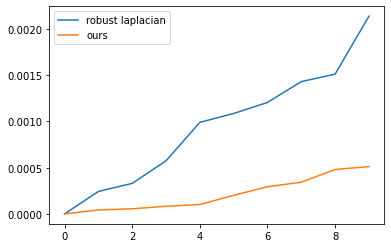

In [5]:
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(10)

plt.plot(poly_vals)
plt.plot(cot_vals)
# plt.plot(eq_vals)
# plt.plot(neq_vals)
# plt.plot(x, 3 * x)
# plt.plot(x, 4 * x)
plt.legend(['robust laplacian','ours'], loc='upper left')
plt.show()

In [92]:
#creat the new dataset
import random
import os.path
def add_noise():
    files = glob.glob('data/new_data/smooth_mesh/*.obj')
    
    for file in files:
        outpath = 'data/new_data/noisy_mesh/' + file.split('/')[-1]
        if os.path.isfile(outpath):
            print(outpath)
            continue
            
        smooth_mesh = trimesh.load_mesh(file)
        scale = smooth_mesh.scale/(random.randint(50,300))
        noisy_mesh = trimesh.permutate.noise(smooth_mesh,scale)
        
        output =  noisy_mesh.export(outpath)
        
        
        
add_noise()

data/new_data/noisy_mesh/pyramid_n3.obj
data/new_data/noisy_mesh/girl-scanned_n1.obj
data/new_data/noisy_mesh/carter100K_n1.obj
data/new_data/noisy_mesh/trim-star_n1.obj
data/new_data/noisy_mesh/trim-star_n2.obj
data/new_data/noisy_mesh/rockerarm_n3.obj
data/new_data/noisy_mesh/pyramid-scanned_n1.obj
data/new_data/noisy_mesh/boy01-scanned_n1.obj
data/new_data/noisy_mesh/fandisk_n3.obj
data/new_data/noisy_mesh/block_n2.obj
data/new_data/noisy_mesh/leg_n1.obj
data/new_data/noisy_mesh/pyramid_n1.obj
data/new_data/noisy_mesh/sculpt_n2.obj
data/new_data/noisy_mesh/fandisk_n1.obj
data/new_data/noisy_mesh/gear_n2.obj
data/new_data/noisy_mesh/chinese-lion_n2.obj
data/new_data/noisy_mesh/star_n3.obj
data/new_data/noisy_mesh/ccylinder_n2.obj
data/new_data/noisy_mesh/gear_n3.obj
data/new_data/noisy_mesh/turbine-Lp_n3.obj
data/new_data/noisy_mesh/block_n3.obj
data/new_data/noisy_mesh/big-girl-scanned_n1.obj
data/new_data/noisy_mesh/star_n1.obj
data/new_data/noisy_mesh/sharp-sphere_n1.obj
data/new_

In [90]:
from shutil import copyfile
import os.path

files = glob.glob('data/new_data/noisy_mesh/*.obj')
for file in files:
    name = file.split('/')[-1]
    smooth_path = 'data/new_data/fast/'
    fname = smooth_path + name
    if os.path.isfile(fname):
        dest = 'data/new_data/smooth_mesh/' + name
        copyfile(fname,dest)
    else:
        new_name = 'data/new_data/fast/'+ name.split('_')[0] +'.obj'
        if os.path.isfile(new_name):
            dest = 'data/new_data/smooth_mesh/' + name
            copyfile(new_name,dest)
        else:
            print('file not found: ', new_name)




In [93]:
files = glob.glob('data/new_data/smooth_mesh/*.obj')
len(files)

222